<div class='alert-block alert-info'>
    <br>
    <h1 align="center"><b>  Lab session 5 :</b> Reinforcement Learning: Dynamic Programming </h1>
    <h3 align="center">Artificial Intelligence Algorithms </h3>
    <h5 align="center">MESIIN476024</a></h5>
    <br>
</div>

DIA-5

- Lorrain MORLET

- Noemie MAZEPA

#### **Session Outline:**
This session is structured into two distinct parts:

1.	**MDP-RL Focus (1.5 hours):** Dive into key concepts and applications of Markov Decision Processes and Reinforcement Learning.
2.	**Project Work (1.5 hours):** The second half will be dedicated to making progress on the ongoing project.  Final lab session will be dedicated to project presentations.

<h1 align="left"> <font color='darkblue'><b> A. MDP-RL Focus </b></font></a></h1>  

This tutorial introduces the foundational concepts and practical implementation of Markov Decision Processes (MDPs) and Reinforcement Learning (RL), leveraging **OpenAI Gym** to build hands-on experience. This part is divided into multiple sections to progressively explore the topic, culminating in practical exercises to solidify understanding.




<h2 align="left"> <font color='darkblue'><b> 1. Introduction to Gymnasium API </b></font></a></h2>  

Gymnasium, a maintained fork of OpenAI Gym ([https://gymnasium.farama.org](https://gymnasium.farama.org)), is a Python library designed to provide a diverse collection of environments for reinforcement learning (RL) experiments through a unified interface. The central concept in Gymnasium is the **environment** (`Env` class), which encapsulates the functionality and capabilities required for RL tasks.

---

<h3 align="left"> <b> a. Key Features of Gymnasium Environments </b></h3>  

Every Gymnasium environment provides the following key pieces of information and functionality:

- **Action Space:** Defines the set of allowable actions that an agent can take. Gymnasium supports:
  - **Discrete actions** (e.g., selecting from a finite number of options).
  - **Continuous actions** (e.g., choosing a value within a range).
  - **Combined spaces** for more complex setups.

- **Observation Space:** Describes the shape and boundaries of the information (state) provided to the agent about the environment.

- **Methods:**
  - `step(action)`: Executes an action in the environment and returns:
    - The current **observation** (new state).
    - The **reward** for the action taken.
    - A **terminated** flag indicating if the episode has ended successfully.
    - A **truncated** flag indicating if the episode ended due to a time limit or other criteria.
    - An **info** dictionary containing additional information (optional).
  - `reset()`: Resets the environment to its initial state and returns the first observation along with additional **info**.

- **Environment Naming Convention:**  
  Each Gymnasium environment has a unique name following the `EnvironmentName-vX` format, where `X` denotes the version number. Versions distinguish between updates or modifications in the environment, such as bug fixes or significant changes.

- For more details, refer to the documentation website at [gymnasium.farama.org](https://gymnasium.farama.org) or the package information on  [pypi.org/project/gymnasium](https://pypi.org/project/gymnasium).
---

<h3 align="left"> <b> b. Creating an Environment </b></h3>  

To create an environment, Gymnasium provides the `make(env_name)` function, which takes the environment’s name as a string. For example:


In [1]:
# '''Make sure that Gymnasium is already installed, or install it using the following command:'''

# !pip install gymnasium

In [2]:
import gymnasium as gym

# Create the FrozenLake-v1 environment with rendering enabled
env = gym.make("FrozenLake-v1", render_mode="rgb_array")

Let's look at the frozen lake environment using the render function and matplotlib library:

Initial frame


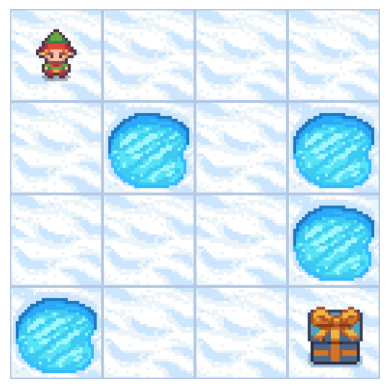

In [3]:

import matplotlib.pyplot as plt

# Reset the environment to its initial state
new_state, info = env.reset()

# Function to display the rendered frame
def display_frame(env):
    frame = env.render()  # Get the RGB array of the current frame
    plt.imshow(frame)
    plt.axis("off")  # Hide axes for better visualization
    plt.show()

# Display the initial frame
print("Initial frame")
display_frame(env)


As we can see, our agent starts in cell $(0, 0)$, and its goal is to reach cell $(3, 3)$ while avoiding the hole cells scattered across the grid. In the next section, we will explore in more detail the various components of a Gymnasium environment and the information it contains.

To get an overview of the different environments available in Gymnasium and explore one of them, you can use the following code. It retrieves and lists all the available environments in the Gymnasium library, along with the total number of environments currently supported.

In [4]:
from gymnasium import envs

# Get all environments and count them
all_envs = envs.registry.keys()
num_envs = len(all_envs)

print("Number of environments:", num_envs)


# Retrieve all environment names
all_envs = gym.envs.registry.keys()
print("----")
# Print each environment name
for env_name in all_envs:
    print(env_name)

Number of environments: 62
----
CartPole-v0
CartPole-v1
MountainCar-v0
MountainCarContinuous-v0
Pendulum-v1
Acrobot-v1
phys2d/CartPole-v0
phys2d/CartPole-v1
phys2d/Pendulum-v0
LunarLander-v3
LunarLanderContinuous-v3
BipedalWalker-v3
BipedalWalkerHardcore-v3
CarRacing-v3
Blackjack-v1
FrozenLake-v1
FrozenLake8x8-v1
CliffWalking-v0
Taxi-v3
tabular/Blackjack-v0
tabular/CliffWalking-v0
Reacher-v2
Reacher-v4
Reacher-v5
Pusher-v2
Pusher-v4
Pusher-v5
InvertedPendulum-v2
InvertedPendulum-v4
InvertedPendulum-v5
InvertedDoublePendulum-v2
InvertedDoublePendulum-v4
InvertedDoublePendulum-v5
HalfCheetah-v2
HalfCheetah-v3
HalfCheetah-v4
HalfCheetah-v5
Hopper-v2
Hopper-v3
Hopper-v4
Hopper-v5
Swimmer-v2
Swimmer-v3
Swimmer-v4
Swimmer-v5
Walker2d-v2
Walker2d-v3
Walker2d-v4
Walker2d-v5
Ant-v2
Ant-v3
Ant-v4
Ant-v5
Humanoid-v2
Humanoid-v3
Humanoid-v4
Humanoid-v5
HumanoidStandup-v2
HumanoidStandup-v4
HumanoidStandup-v5
GymV21Environment-v0
GymV26Environment-v0


<h2 align="left"> <font color='darkblue'><b> 2. Understanding and Exploring the FrozenLake-v1 Environment  </b></font></h2>  

The **FrozenLake-v1** environment is a classic reinforcement learning task where an agent must navigate across a frozen grid to reach a goal. The grid world contains several types of terrain that affect the agent's movement and rewards.

![FrozenLake Example Layout](images/Frozen_Lake.png)



In [5]:
import gymnasium as gym
# Create the FrozenLake-v1 environment with rendering enabled
env = gym.make("FrozenLake-v1", render_mode="rgb_array")

<h3 align="left"> <b> a. Grid Description</b></h3>  
The environment consists of a grid (visible in the figure), with the following cell types:
- **Start (S)**: The agent starts at cell \((0, 0)\).
- **Frozen (F)**: Safe cells where the agent can move freely without penalty.
- **Hole (H)**: Dangerous cells; if the agent steps here, the episode ends with zero reward.
- **Goal (G)**: The treasure cell; reaching this cell ends the episode with a positive reward.

The agent's objective is to navigate from the **Start** to the **Goal** while avoiding the **Holes**. The environment's layout is defined by an $n \times n$ grid, which can vary in size depending on the specific configuration. For a **4x4 FrozenLake grid**, the state indices are as follows:

|       | **0**  | **1**  | **2**  | **3**  |
|-------|--------|--------|--------|--------|
| **0** | 0  | 1  | 2  | 3  |
| **1** | 4  | 5  | 6  | 7  |
| **2** | 8  | 9  | 10 | 11 |
| **3** | 12 | 13 | 14 | 15 |


In [6]:
import gymnasium as gym

# Create the FrozenLake environment
env = gym.make("FrozenLake-v1", is_slippery=True)

# Get the total number of states
num_states = env.observation_space.n # Discrete(16) (4x4 grid)

# Display the set of states
layout = env.unwrapped.desc
print("State Mapping with Grid Layout:")
for i, row in enumerate(layout):
    mapped_row = [f"{cell.decode('utf-8')}({i*4+j})" for j, cell in enumerate(row)]
    print(" ".join(mapped_row))

# Close the environment
env.close()

State Mapping with Grid Layout:
S(0) F(1) F(2) F(3)
F(4) H(5) F(6) H(7)
F(8) F(9) F(10) H(11)
H(12) F(13) F(14) G(15)


**Evironment Layout:**

``` python
    S F F F
    F H F H
    F F F H
    H F F G

In [7]:
import gymnasium as gym

# Create the FrozenLake environment
env = gym.make("FrozenLake-v1", is_slippery=True)

# Access the layout of the environment
layout = env.unwrapped.desc

# Print the layout
print("FrozenLake Layout:")
for row in layout:
    print(" ".join(cell.decode("utf-8") for cell in row))  # Decode bytes to strings

# Close the environment
env.close()

FrozenLake Layout:
S F F F
F H F H
F F F H
H F F G


---
<h3 align="left"> <b> b. Set of Actions</b></h3> 

The agent in the environment has four possible moves — Up, Down, Left and Right.
  - **0**: Move **left**  <-.
  - **1**: Move **down**  ↓.
  - **2**: Move **right**  ->.
  - **3**: Move **up**  ↑.


Action Space: Discrete(4)
Performed action: ← (0)


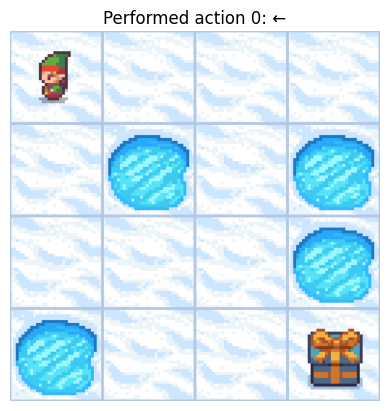

Performed action: ↓ (1)


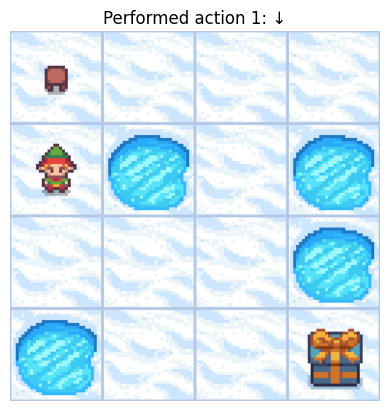

Performed action: → (2)


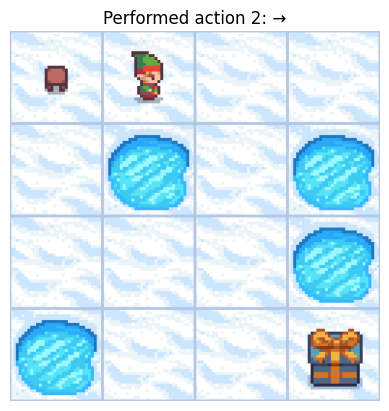

Performed action: ↑ (3)


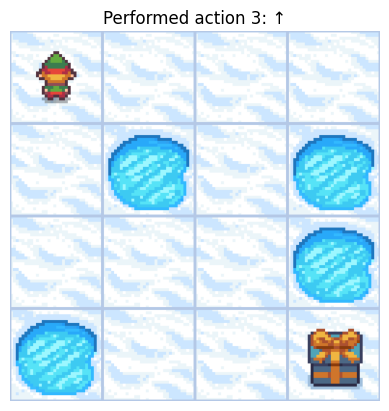

In [8]:
import gymnasium as gym
import matplotlib.pyplot as plt

# Action Space:
print("Action Space:", env.action_space)

# Map actions to directions
actions_map = {0: '←', 1: '↓', 2: '→', 3: '↑'}

# Create the FrozenLake-v1 environment with rendering enabled
env = gym.make("FrozenLake-v1", render_mode="rgb_array",  is_slippery=False)

# Reset the environment to its initial state


# Function to display the rendered frame
def display_frame(env, action=None):
    frame = env.render()  # Get the RGB array of the current frame
    plt.imshow(frame)
    plt.axis("off")  # Hide axes for better visualization
    if action is not None:
        plt.title(f"Performed action {action}: {actions_map[action]}")  # Display the action
    plt.show()

# Take each possible action in the environment and display the result
for action in range(4):
    new_state, info = env.reset()
    print(f"Performed action: {actions_map[action]} ({action})")  # Display action number and description
    new_state, reward, terminated, truncated, info = env.step(action)  # Take the action
    display_frame(env, action)  # Display the rendered frame
# Close the environment
env.close()

---
<h3 align="left"> <b> c. Stochastic Action Dynamics</b></h3> 

The **FrozenLake** environment introduces stochasticity to simulate the slippery nature of ice.  The agent's actions do not always result in the expected movement. Instead, the transitions are probabilistic:

- $P(0.333)$: The agent moves in the intended direction.
- $P(0.333)$: The agent moves at a 90° angle to the intended direction (either left or right).
- $P(0.333)$: The agent moves in the opposite direction.

This behavior makes navigation challenging, as the agent must account for the inherent uncertainty in its actions.


**Example:**

The following diagram illustrates the stochastic dynamics:

<div style="text-align: center;">
    <img src="images/Stochastic_Dynamics.png" width="400" />
</div>

- From **state 6**, when taking **action 0** (move left):
  - There is a **0.33 probability** of transitioning to **state 2**, with a reward of **0.0**. The transition is **non-terminal**.
  - There is a **0.33 probability** of transitioning to **state 5**, with a reward of **0.0**. The transition is **terminal**, and the MDP ends.
  - There is a **0.33 probability** of transitioning to **state 10**, with a reward of **0.0**. The transition is **non-terminal**.



This stochastic behavior increases the complexity of the environment, as the agent cannot always predict its exact position after an action. Consequently, it requires the agent to develop a robust and adaptable policy that considers the probabilities of all possible outcomes and maximize its chances of reaching the goal while minimizing the risks of falling into a hole.

In [9]:
# Create FrozenLake environment with custom grid
env = gym.make("FrozenLake-v1",  is_slippery=True)


**Note on Dynamics (`is_slippery`)**

1.	**is_slippery=True:**
    - Actions are stochastic, meaning the agent might slip into an unintended cell.
	- Adds complexity and randomness to the environment.
2.	**is_slippery=False:**
	- Actions are deterministic, and the agent moves exactly as intended.

In [10]:
# Access the raw environment object
raw_env = env.unwrapped

for proba, next_state, reward, finished in raw_env.P[0][1]:  # Example: State 0, Action 1
    print(f"Transition Probability[{0}][{next_state}]: {proba}")

Transition Probability[0][0]: 0.3333333333333333
Transition Probability[0][4]: 0.3333333333333333
Transition Probability[0][1]: 0.3333333333333333


---
<h3 align="left"> <b> d. Reward System</b></h3> 

The reward system in **FrozenLake** is sparse:
- **0** for each step, regardless of the type of cell (no penalty for frozen cells or movement through the grid).
- **0** for falling into a hole (**H**), ending the episode immediately.
- **1** for reaching the goal (**G**), ending the episode successfully.

This sparse reward structure forces the agent to optimize its policy by learning from successful attempts to reach the goal.

In [11]:
state = 14  # Example current state
rewards = {}

for action in raw_env.P[state]:
    rewards[action] = []
    for proba, next_state, reward, finished in raw_env.P[state][action]:
        rewards[action].append((next_state, reward))  # Include next_state index

print(f"Rewards for state {state}:")
for action, transitions in rewards.items():
    print(f"  Action {action}:")
    for next_state, reward in transitions:
        print(f"    Next State: {next_state}, Reward: {reward}")

Rewards for state 14:
  Action 0:
    Next State: 10, Reward: 0.0
    Next State: 13, Reward: 0.0
    Next State: 14, Reward: 0.0
  Action 1:
    Next State: 13, Reward: 0.0
    Next State: 14, Reward: 0.0
    Next State: 15, Reward: 1.0
  Action 2:
    Next State: 14, Reward: 0.0
    Next State: 15, Reward: 1.0
    Next State: 10, Reward: 0.0
  Action 3:
    Next State: 15, Reward: 1.0
    Next State: 10, Reward: 0.0
    Next State: 13, Reward: 0.0


<h3 style="color: darkred;"><b>Exercice1: Your Turn to Explore</b></h3>

Now, it's up to you to explore the **FrozenLake** environment and extract meaningful insights by writing code snippets. Use the following questions as a guide to analyze and understand the dynamics of the environment.

1. **Initial State**: Display the initial state of the environment. Understand where the agent starts on the grid and how it maps to the state space.

2. **Next States**: Retrieve and examine the possible next states after taking a specific action in a given state. For example, explore how actions like `←`, `↓`, `→`, and `↑` affect the agent's position on the grid. 

3. **Episode Termination (`done`)**: Determine whether an episode ends after a particular state transition. This will help identify terminal states, such as falling into a hole or reaching the goal.

4. **Episode Information**: Extract and track details about the current episode, including:
	-	Cumulative rewards.
	-	Total steps taken.
	-	Whether the episode was completed successfully or terminated early.

5. **Random/Greedy Policy**: Implement a random or greedy policy (e.g., always move right), and observe its performance.
6. **Close the environment**: Ensure the environment is closed properly after your exploration to release resources.

For more details, refer to the table below and revisit the links to the **Gymnasium documentation** mentioned at the beginning of this notebook. These resources provide additional context, explanations, and examples to support your exploration and understanding.

In [12]:
# Your code
env = gym.make("FrozenLake-v1", is_slippery=True, render_mode="rgb_array")
env.reset()

(0, {'prob': 1})

### 1. Initial State

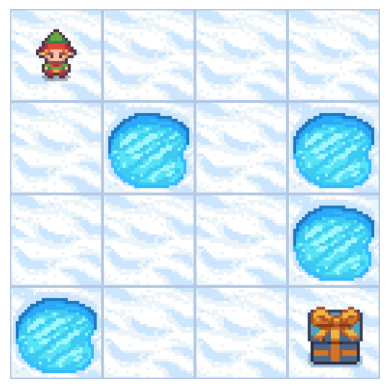

In [13]:
display_frame(env)

### 2. Next States

Probability: 0.3333333333333333, Next State: 13, End: False, Reward: 0.0
Probability: 0.3333333333333333, Next State: 14, End: False, Reward: 0.0
Probability: 0.3333333333333333, Next State: 15, End: True, Reward: 1.0


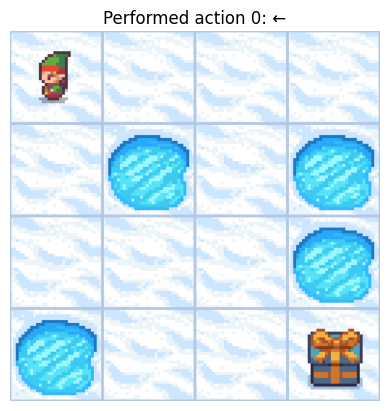

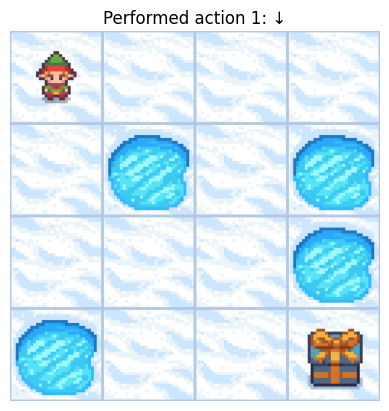

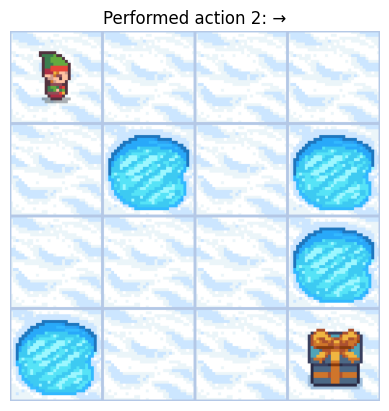

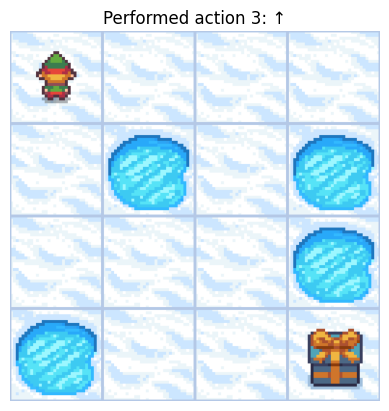

In [14]:
state, action = 14, 1
for proba, next_state, reward, finished in raw_env.P[state][action]:
    print(f"Probability: {proba}, Next State: {next_state}, End: {finished}, Reward: {reward}")

for action in range(4):
    new_state, reward, terminated, truncated, info = env.step(action)
    display_frame(env, action)

### 3. Episode Termination

In [15]:
state, action = 4, 1
for proba, next_state, reward, finished in raw_env.P[state][action]:
    print(f"Next State: {next_state}, End? : {finished}, Reward: {reward}")


Next State: 4, End? : False, Reward: 0.0
Next State: 8, End? : False, Reward: 0.0
Next State: 5, End? : True, Reward: 0.0


### 4. Episode Information

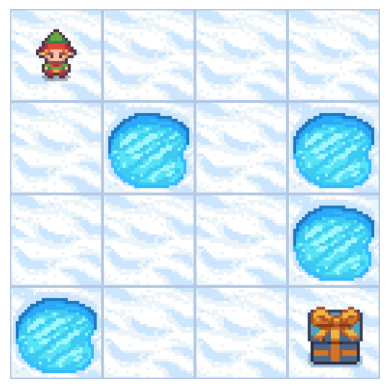

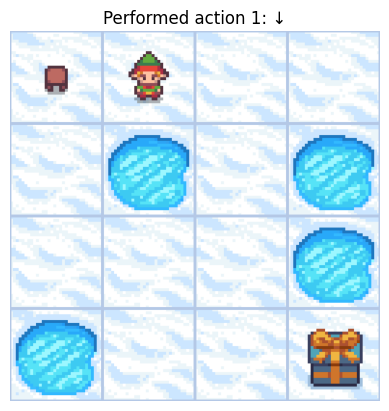

New State: 0
Observation: 1
Reward: 0.0
Terminated: False
Truncated: False
Info: {'prob': 0.3333333333333333}


In [16]:
state, info = env.reset()
display_frame(env)
action = 1
new_state, reward, terminated, truncated, info = env.step(action)
display_frame(env, action)
# print the infos
print("New State:", state)
print("Observation:", new_state)
print("Reward:", reward)
print("Terminated:", terminated)
print("Truncated:", truncated)
print("Info:", info)



### 5. Random/Greedy Policy
Always move right

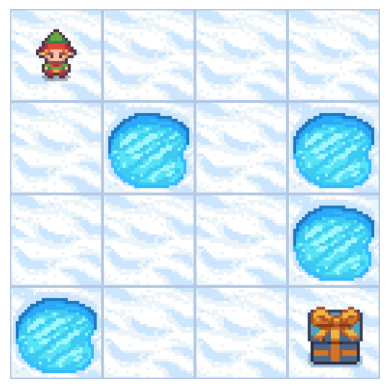

observation: 0, reward: 0.0, done: False, truncated: False info: {'prob': 0.3333333333333333}


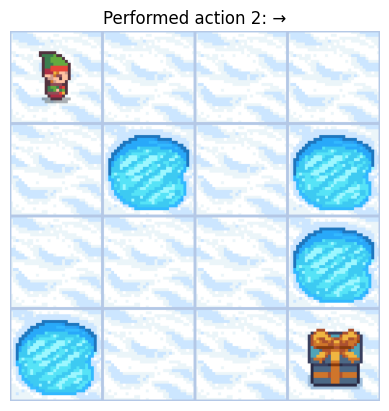

observation: 0, reward: 0.0, done: False, truncated: False info: {'prob': 0.3333333333333333}


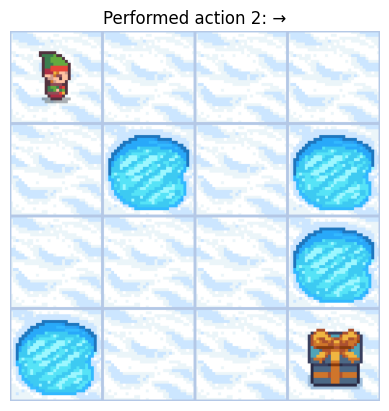

observation: 0, reward: 0.0, done: False, truncated: False info: {'prob': 0.3333333333333333}


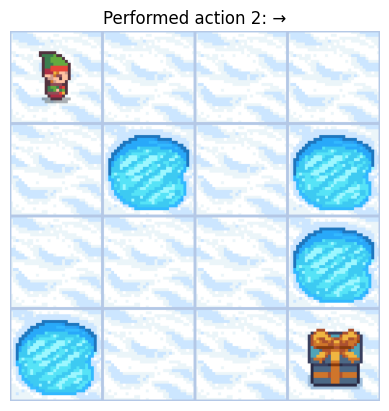

observation: 0, reward: 0.0, done: False, truncated: False info: {'prob': 0.3333333333333333}


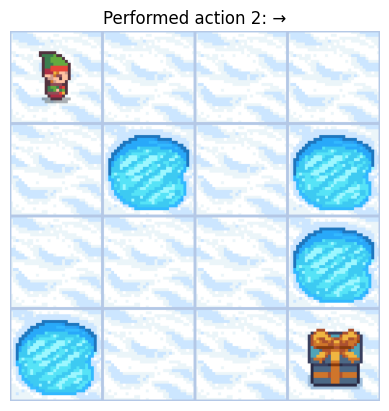

observation: 0, reward: 0.0, done: False, truncated: False info: {'prob': 0.3333333333333333}


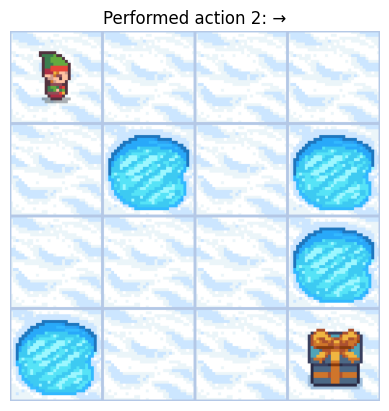

observation: 1, reward: 0.0, done: False, truncated: False info: {'prob': 0.3333333333333333}


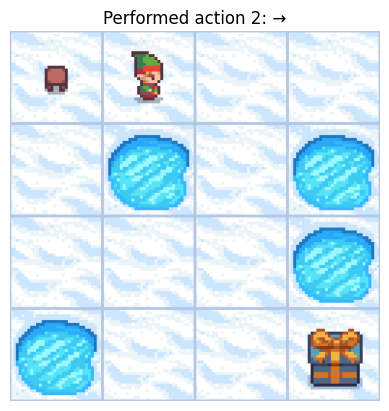

observation: 2, reward: 0.0, done: False, truncated: False info: {'prob': 0.3333333333333333}


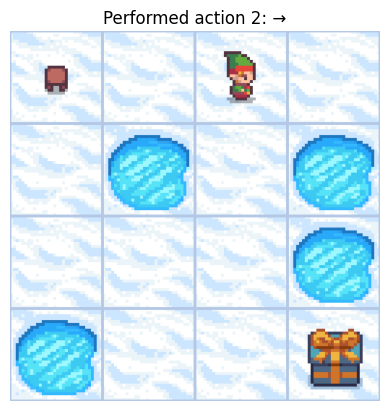

observation: 2, reward: 0.0, done: False, truncated: False info: {'prob': 0.3333333333333333}


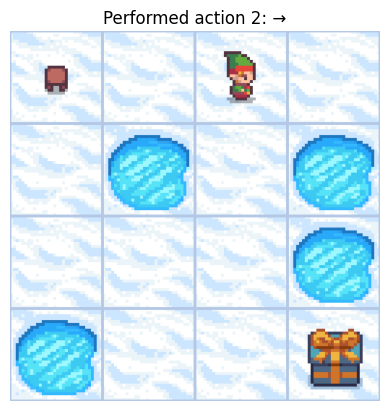

observation: 3, reward: 0.0, done: False, truncated: False info: {'prob': 0.3333333333333333}


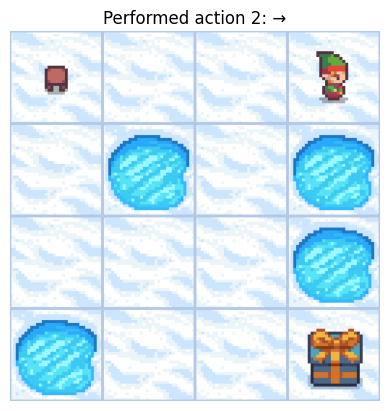

observation: 3, reward: 0.0, done: False, truncated: False info: {'prob': 0.3333333333333333}


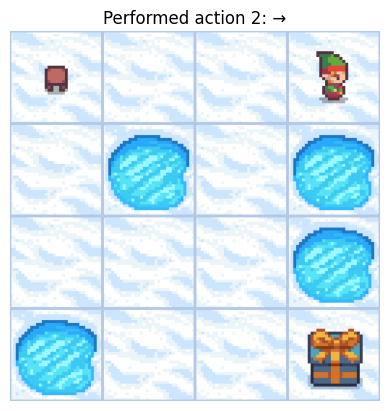

observation: 7, reward: 0.0, done: True, truncated: False info: {'prob': 0.3333333333333333}


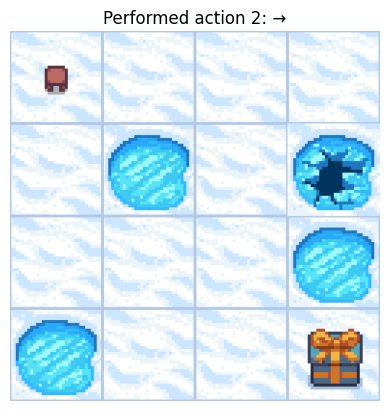

Episode finished after 11 steps
Final state: 7
Reach the goal: False


In [17]:
env = gym.make("FrozenLake-v1", is_slippery=True, render_mode="rgb_array")
state, info = env.reset()
display_frame(env)
action = 2
steps = 0
done = False

while not done:
    new_state, reward, done, truncated, info = env.step(action)
    print(f'observation: {new_state}, reward: {reward}, done: {done}, truncated: {truncated} info: {info}')
    display_frame(env, action)
    steps += 1

print(f"Episode finished after {steps} steps")
print("Final state:", new_state)
print("Reach the goal:", reward == 1)

### 6. Close the Environment

In [18]:
env.close()

**Summary of Retrievable Information**

| **Data**                   | **How to Retrieve**                | **Usage**                                   |
|----------------------------|-------------------------------------|--------------------------------------------|
| **State Space**            | `env.observation_space`            | Understand the environment's size.         |
| **Action Space**           | `env.action_space`                 | Know the set of possible actions.          |
| **Transition Probabilities** | `raw_env.P`                      | Analyze stochastic dynamics.               |
| **Rewards**                | `raw_env.P`                        | Understand reward structure.               |
| **Episode Termination (`done`)** | `raw_env.P`                   | Identify terminal states.                  |
| **Grid Layout**            | `raw_env.desc`                     | Visualize the environment.                 |
| **Initial State**          | `env.reset()`                      | Observe the agent's starting position.     |
| **Rendering**              | `env.render()`                     | Debug and visualize agent behavior.        |
| **Episode Information**    | `env.step(action)` (returns `info`) | Monitor performance during an episode.     |

### **Exercise 1 - Results Analysis**


- The agent always starts in the same spot: the top-left corner of the grid, and this position is mapped to a unique state. This consistency is useful for testing and comparing different strategies.

- Actions affect the movement of the agent. Indeed, actions (up, down, left and right) don’t always lead to the expected outcome because the grid is slippery. This randomness makes the agent’s movement unpredictable, which adds an extra challenge.

- An episode finishes when the agent either falls into a hole (failure) or reaches the goal (success). These "terminal states" are important because they determine if the agent's actions were good or bad.

- During each episode, we can track metrics like total rewards, how many steps the agent took, and if it reached the goal. These metrics give a good sense of how well a strategy is working.

- Trying random actions or fixed strategies like always moving right shows that they’re often ineffective in this environment. The randomness of the grid makes it clear that smarter and more flexible strategies are needed.

- Properly closing the environment after running tests is important to avoid resource issues, especially when we run multiple simulations.



In this exercise we follow a Markov Decision Process with the states, actions and rewards being connected to each other, which is the basis of Reinforcement Learning. The unpredictability of the grid reflects real-world scenarios, where actions don’t always lead to the expected results and this highlights the fact that agents need to learn and adapt to the environment. Testing simple strategies like random or greedy policies shows how important it is to learn optimal strategies when using Reinforcement Learning algorithms like Q-learning. Finally, the agent wants to maximize its rewards (+1 if it reaches the goal) and this learning based on rewards is one of the main elements of Reinforcement Learning.

<h2 align="left"> <font color='darkblue'><b> 3. Compute Optimal Policy </b></font></h2>  


The <b>FrozenLake-v1</b> environment presents a challenging grid-based problem where the agent must navigate from the start position to the goal while avoiding holes. This task becomes significantly more complex under stochastic dynamics (<code>is_slippery=True</code>), where the agent's actions may not always result in the intended movement. Instead, the environment introduces randomness, causing the agent to "slip" and move in unintended directions, making planning and decision-making critical.


---

<h3 align="left"> <font color='darkred'><b> Exercice 2: Implement Value Iteration Algorithm </b></font></h3>  

Value Iteration is a fundamental reinforcement learning algorithm used to compute the optimal policy for an environment. It works by iteratively updating the value function for each state based on the expected rewards and the dynamics of the environment. In the case of **FrozenLake-v1** with stochastic dynamics, Value Iteration must account for the uncertainty in transitions, ensuring that the computed policy balances the risks of slipping with the rewards of reaching the goal.



<div style="text-align: center;">
    <img src="images/Value_Iteration.png" width="600" />
</div>

The diagram above illustrates the process of Value Iteration, where the agent evaluates the value of each state iteratively until convergence. The resulting optimal policy guides the agent through the environment, avoiding hazards and maximizing its chances of success despite the stochastic dynamics.

<font color='darkred'><b>Your tasks are:</b></font>
<ol>
    <li>Implement the <b>Value Iteration algorithm</b>. Run the algorithm to obtain the optimal policy for the <b>FrozenLake-v1</b> stochastic environment. How many iterations does the policy need to converge?</li>
    <li>Use the code below to visualize the agent's steps as it navigates the environment based on the derived optimal policy.</li>
    <li>Observe and analyze the agent's performance under deterministic dynamics (<b>is_slippery=False</b>).</li>
</ol>

In [19]:
import numpy as np
import time

# Your code
env = gym.make("FrozenLake-v1", is_slippery=True, render_mode="rgb_array")

V = {state: 0 for state in range(env.observation_space.n)}
policy = {state: env.action_space.sample() for state in range(env.observation_space.n)}

sigma = 1e-10
gamma = 0.999
steps = 0

start = time.time()

while True:
    delta = 0
    Q = {state: [0 for _ in range(env.action_space.n)] for state in range(env.observation_space.n)}
    for state, v in V.items():
        for action in range(env.action_space.n):
            Q[state][action] = sum(proba * (reward + gamma * V[next_state]) for proba, next_state, reward, _ in raw_env.P[state][action])
        V[state] = max(Q[state])
        delta = max(delta, abs(v - V[state]))
    if delta < sigma:
        # extract the optimal policy
        policy = {state: max(range(env.action_space.n), key=lambda action: Q[state][action]) for state in range(env.observation_space.n)}
        break
    steps += 1

end = time.time()

def convert_dict_to_matrix(dictionary):
    return np.array([dictionary[key] for key in sorted(dictionary.keys())]).reshape(4, 4)
def convert_dict_to_arrow(dict):
    return {key: actions_map[value] for key, value in dict.items()}

print("Number of steps:", steps, "Time taken:", end - start)
print("Value Function:")
print(convert_dict_to_matrix(V))
print("Policy:")
print(convert_dict_to_matrix(convert_dict_to_arrow(policy)))

optimal_policy = policy

Number of steps: 567 Time taken: 0.04008960723876953
Value Function:
[[0.78553326 0.77855409 0.77391292 0.77159581]
 [0.78789221 0.         0.50573092 0.        ]
 [0.79261722 0.79972245 0.74479855 0.        ]
 [0.         0.86415315 0.93117891 0.        ]]
Policy:
[['←' '↑' '↑' '↑']
 ['←' '←' '←' '←']
 ['↑' '↓' '←' '←']
 ['←' '→' '↓' '←']]



Simulating the agent's steps:


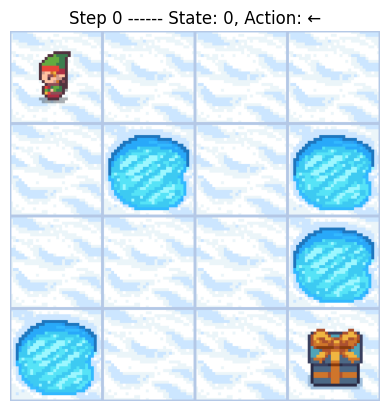

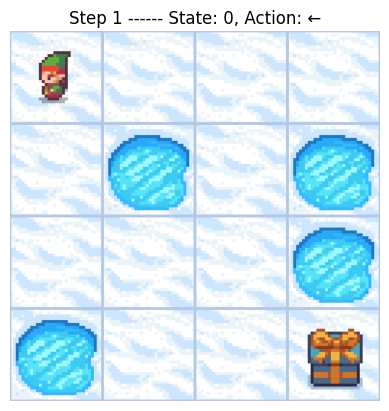

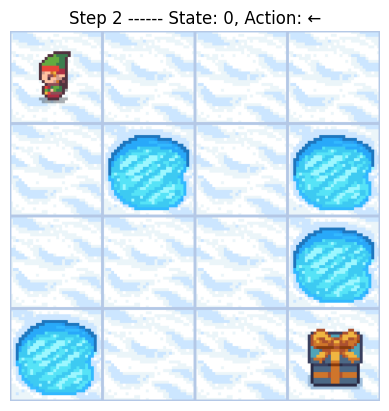

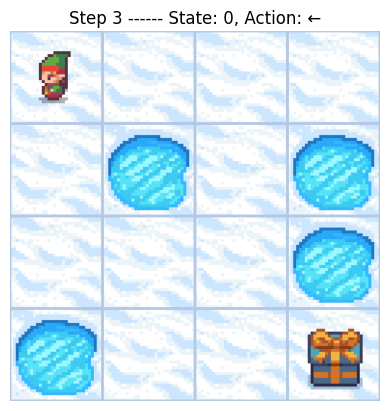

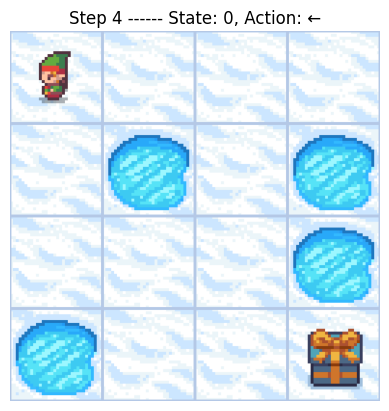

...

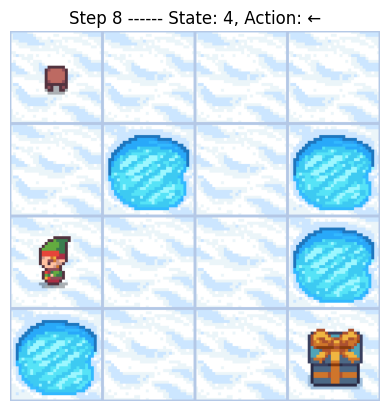

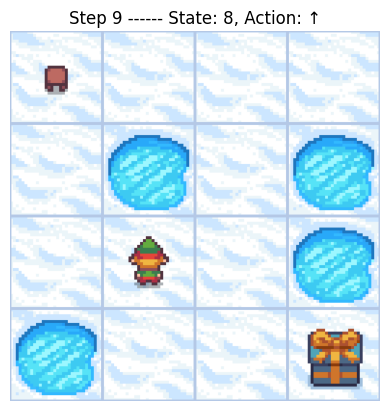

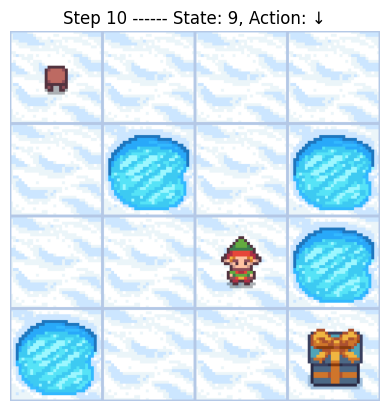

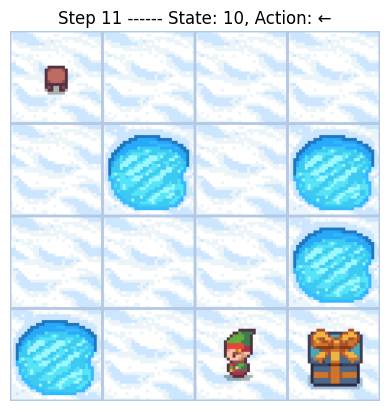

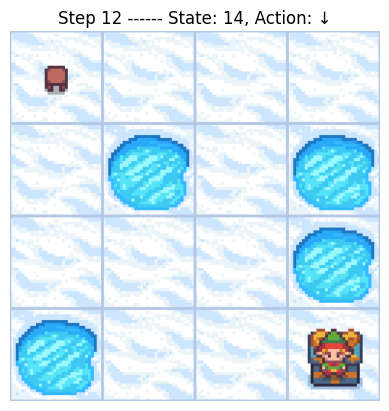


Final State: 15, Reward: 1.0
Number of steps used: 13


In [24]:
import matplotlib.pyplot as plt

def display_policy(policy):
    env = gym.make("FrozenLake-v1", is_slippery=True, render_mode="rgb_array")
    # Visualization: Simulate the environment using the derived policy
    state = env.reset()[0]
    finished = False

    print("\nSimulating the agent's steps:")
    steps = 0
    while not finished:
        # Take the action based on the optimal policy
        action = policy[state]
        new_state, reward, finished, _, _ = env.step(action)

        # Render the environment and display steps
        img = env.render()
        plt.imshow(img)

        plt.title(f"Step {steps} ------ State: {state}, Action: {actions_map[action]}")
        plt.axis('off')
        plt.show()

        # Transition to the new state
        state = new_state
        steps = steps + 1

    # Final reward and state
    print(f"\nFinal State: {state}, Reward: {reward}")
    print(f"Number of steps used: {steps}")
    env.close()
    
display_policy(optimal_policy)

### **Exercise 2 - Results Analysis**

- The Value Iteration algorithm converged after **567 iterations**, with the optimal policy and value function found for the stochastic FrozenLake-v1 environment. The large number of steps shows how hard it is to handle these random changes and delayed rewards in this setting. The algorithm completed in **0.040 seconds**, showing it is computationally efficient for small environments like FrozenLake.

- The value function shows the maximum expected reward for each state. Higher values are concentrated near the goal which is state 15 and this indicates that these states are more beneficial for the agent to reach. States with holes or far from the goal have lower rewards because the risks or distance make their expected rewards lower.

- The calculated policy recommends the best move for each spot to get the most rewards over time. For instance, near the goal, moves like down (↓) or right (→) are preferred. However, farther away from the goal, the plan includes smart moves to avoid falling into holes. The best plan balances safety (like avoiding dangers) and efficiency (like taking fewer steps).

- When the agent follows the optimal policy, it reaches the goal (state 15) after **13 steps**. This shows the effectiveness of the policy because the agent avoids dangers while moving toward the goal efficiently. However, this result has to be regarded with precaution because there is a lot of randomness in during the process and could greatly change from one try to another.

- When the environment is set to is_slippery=False, transitions become fixed, and the agent's path is more predictable and consistent. Fixed changes simplify the problem a lot by reducing need for planning with probabilities and allowing for a quicker reach of the goal.


This exercise shows some important ideas in Reinforcement Learning. The Value Iteration algorithm uses the Bellman equation to calculate the value of each state step by step, taking into account short-term rewards with long-term ones and it eventually finds the best possible policy. Since the environment is slippery (is_slippery=True), there’s a level of randomness that makes the problem more realistic, and the algorithm has to handle this uncertainty when figuring out the best moves. The optimal policy it finds helps the agent maximize rewards by smartly mixing safe exploration with actions that bring high rewards. Overall, the value function and policy show how the agent learns to make the best decisions, and the simulation confirms that it work.

---

<h3 align="left"> <font color='darkred'><b> Exercice 3: Implement Policy Iteration Algorithm </b></font></h3>  

<p>
The <b>Policy Iteration</b> algorithm is an iterative approach used to compute the optimal policy for a Markov Decision Process (MDP). It alternates between two steps:
</p>

<ul>
    <li><b>Policy Evaluation</b>: Computes the value function for a fixed policy by iteratively updating state values.</li>
    <li><b>Policy Improvement</b>: Updates the policy by selecting the action that maximizes the expected value for each state.</li>
</ul>

<p>
This process continues until the policy becomes stable, meaning further iterations do not result in any changes.
</p>

<div style="text-align: center;">
    <img src="images/Policy_Iteration_.png" width="400" />
</div>

<p>
The diagram above illustrates the iterative nature of Policy Iteration, combining evaluation and improvement steps to converge to the optimal policy.
</p>

<font color='darkred'><b>Your tasks are:</b>
<ol>
    <li>Implement the <b>Policy Iteration algorithm</b> as a function. Run the algorithm to obtain the optimal policy for the <b>FrozenLake-v1</b> stochastic environment. How many iterations does the policy need to converge?</li>
</ol>
</font>


In [21]:
# Your code
env = gym.make("FrozenLake-v1", is_slippery=True, render_mode="rgb_array")
state, info = env.reset()

V = {state: 0 for state in range(env.observation_space.n)}
pi = {state: env.action_space.sample() for state in range(env.observation_space.n)}
policy = {state: env.action_space.sample() for state in range(env.observation_space.n)}

sigma = 1e-10
gamma = 0.999
steps = 0


# Policy Evaluation
def evaluate_policy(env, pi, V, gamma, sigma):
    while True:
        delta = 0
        for state in range(env.observation_space.n):
            v = V[state]
            V[state] = sum(proba * (reward + gamma * V[next_state]) for proba, next_state, reward, _ in raw_env.P[state][pi[state]])
            delta = max(delta, abs(v - V[state]))
        if delta < sigma:
            break
# Policy Improvement
def improve_policy(env, pi, V, gamma):
    policy_stable = True
    for state in range(env.observation_space.n):
        b = pi[state]
        pi[state] = max(range(env.action_space.n), key=lambda action: sum(proba * (reward + gamma * V[next_state]) for proba, next_state, reward, _ in raw_env.P[state][action]))
        if b != pi[state]:
            policy_stable = False
    if policy_stable:
        return True
    return False

start = time.time()

for _ in range(1000):
    evaluate_policy(env, pi, V, gamma, sigma)
    if improve_policy(env, pi, V, gamma):
        break
    steps += 1

end = time.time()

print("Number of steps:", steps, "Time taken:", end - start)
print("Value Function:")
print(convert_dict_to_matrix(V))
print("Policy:")
print(convert_dict_to_matrix(convert_dict_to_arrow(pi)))

iterative_policy = pi

Number of steps: 5 Time taken: 0.02783679962158203
Value Function:
[[0.78553326 0.77855409 0.77391292 0.77159581]
 [0.78789221 0.         0.50573092 0.        ]
 [0.79261722 0.79972245 0.74479855 0.        ]
 [0.         0.86415315 0.93117891 0.        ]]
Policy:
[['←' '↑' '↑' '↑']
 ['←' '←' '←' '←']
 ['↑' '↓' '←' '←']
 ['←' '→' '↓' '←']]



Simulating the agent's steps:


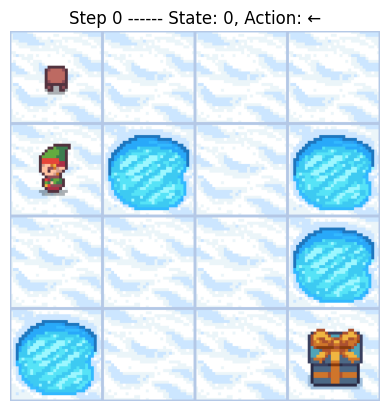

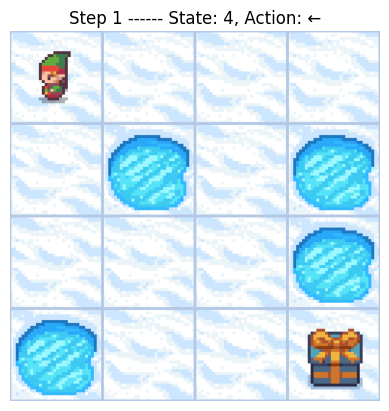

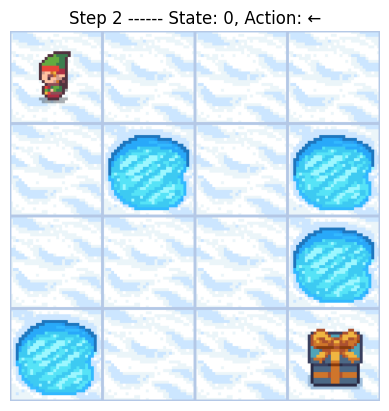

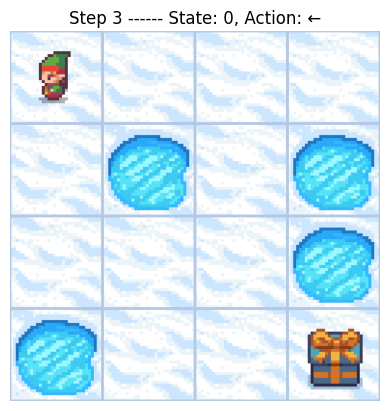

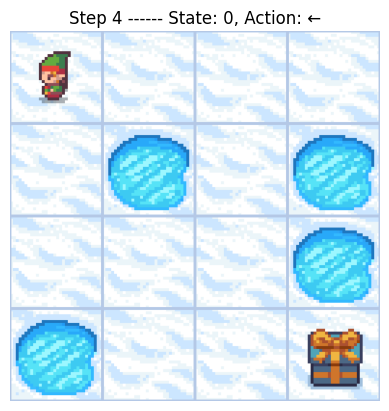

...

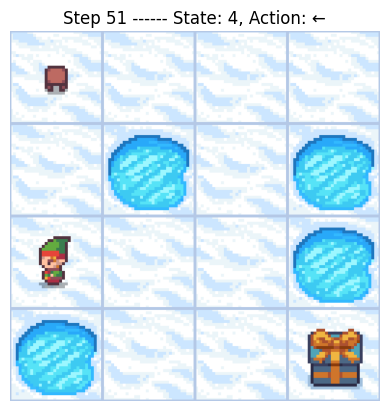

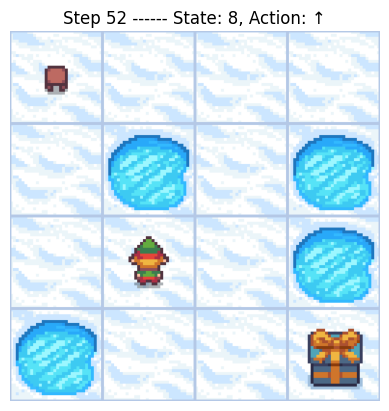

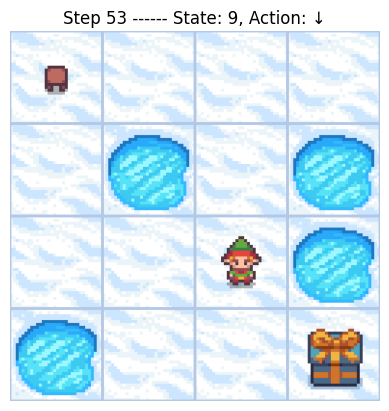

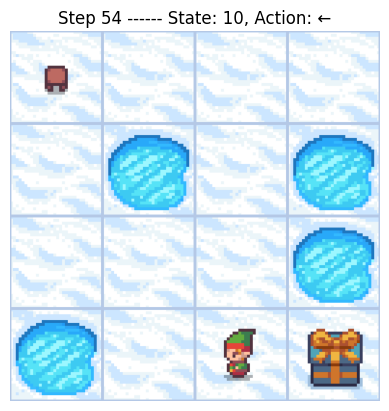

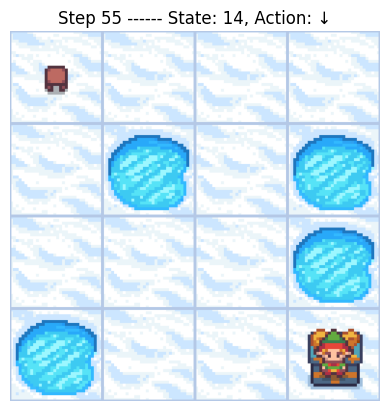


Final State: 15, Reward: 1.0
Number of steps used: 56


In [22]:
display_policy(iterative_policy)

### **Exercise 3 - Results Analysis**

- The algorithm converged to an optimal policy after only **5 iterations**, showing the efficiency of alternating between policy evaluation and policy improvement compared to value iteration. The process took **0.027 seconds**, making it computationally faster for this environment.

- In each step, the method calculated the value of each spot based on the expected rewards and moves under the current policy. The values became steady quickly, showing that the evaluation step worked well in finding the true value of each spot for the given policy.

- The algorithm updated the policy by choosing moves that gave the highest expected value for each spot, using the value function. This step made sure the policy kept getting better until it stopped changing. The improvement step led to steady progress toward the best policy, finishing when no more changes were needed.

- The final policy helps the agent move through the changing FrozenLake-v1 setting, avoiding dangers and making it more likely to reach the goal. The policy shows a clear strategy that balances risk (avoiding slippery spots) and reward (reaching the goal quickly).

- When simulated, the agent successfully reached the goal (state 15) following the optimal policy, earning a reward of 1.0.

Policy iteration required fewer iterations (5 << 567) than value iteration to converge. This highlights its computational efficiency in environments with well-defined transitions and rewards. Policy iteration works by switching between evaluating the current policy and improving it, making steady progress toward the best solution. The process stops when the policy doesn’t change anymore, showing how reliable it is for solving Markov Decision Processes (MDPs). It’s also often faster than value iteration, needing fewer steps to get to the final policy. This makes it a great option for bigger or more complex environments where efficiency really matters.



<h3 align="left"> <font color='darkred'><b> Exercise 4: Implement Q-Learning Algorithm </b></font></h3>  

<p>
Q-Learning is an off-policy reinforcement learning algorithm that estimates <b>Q-values</b>  (state-action values) to derive an optimal policy. The algorithm balances exploration (discovering new actions) and exploitation (choosing the best-known actions) through the use of an epsilon-greedy policy.
</p>

<div style="text-align: center;">
    <img src="images/Q_Learning.png" width="600" />
</div>


<p>
In this exercise, you will implement the <b>Q-Learning algorithm</b> for the <b>FrozenLake-v1</b> environment, which involves stochastic dynamics (<code>is_slippery=True</code>). Your goal is to enable the agent to learn the optimal policy over episodes while balancing exploration and exploitation.
</p>

<p>
Some key concepts related to this algorithm have been discussed in the course. For elements that were not explicitly covered, you are encouraged to conduct your own research and deepen your understanding of how Q-Learning works in practice.
</p>



<font color='darkred'><b>Your tasks are:</b>
<ol>
    <li>Implement the <b>Q-Learning algorithm</b> using the epsilon-greedy exploration strategy.</li>
    <li>Train the agent for a sufficient number of episodes (e.g., 50,000) and observe how the performance improves over time.</li>
    <li>Visualize the learned Q-table and the optimal policy derived from it. Interpret the results.</li>
    <li>Experiment with different epsilon decay rates and learning rates (<code>alpha</code>) to see how they affect the agent's performance.</li></font>
</ol>

In [25]:
import time
# Your code
env = gym.make("FrozenLake-v1", is_slippery=True, render_mode="rgb_array")
state, info = env.reset()

alpha = 0.1
gamma = 0.999
epsilon = 1.0
epsilon_decay = 0.999
epsilon_min = 0.1
total_n_steps = 50000
max_steps_per_episode = 100

Q = {state: [0 for _ in range(env.action_space.n)] for state in range(env.observation_space.n)}
Q[env.observation_space.n - 1] = [1 for _ in range(env.action_space.n)]

def epsilon_greedy_policy(state, Q, epsilon):
    if np.random.rand() < epsilon:
        return env.action_space.sample()
    return np.argmax(Q[state])

start = time.time()

for i in range(total_n_steps):
    state = env.reset()[0]
    done = False
    steps = 0
    while not done and steps < max_steps_per_episode:
        action = epsilon_greedy_policy(state, Q, epsilon)
        new_state, reward, done, _, _ = env.step(action)
        Q[state][action] = Q[state][action] + alpha * (reward + gamma * max(Q[new_state]) - Q[state][action])
        state = new_state
        steps += 1
    epsilon = max(epsilon * epsilon_decay, epsilon_min)
end = time.time()


Time to train: 19.977313995361328
Q-Values:
{0: [1.5963137153498435, 1.5492926956735205, 1.5556702886385698, 1.5581697333872837], 1: [0.9269045900445037, 1.0718906229844036, 1.1498180582434299, 1.5549664518387227], 2: [1.4554076937135279, 1.3654034053141133, 1.3375598701953821, 1.5159075274435263], 3: [1.0107179423095956, 1.2303198998893097, 1.1949033865302854, 1.502555401844805], 4: [1.6035754229073182, 0.8162253140669008, 1.2465892643132803, 0.816250708982754], 5: [0, 0, 0, 0], 6: [1.1287588373261614, 0.328458659958835, 0.8591381057300512, 0.21837124457711754], 7: [0, 0, 0, 0], 8: [1.1514532326687899, 1.078656448885978, 0.9374623016381378, 1.6170041582036356], 9: [1.0245928212970856, 1.636508133247382, 1.2255393783012138, 0.9827338173214948], 10: [1.6069880952534796, 0.9903898778864472, 1.0839785870522056, 0.8873439142509726], 11: [0, 0, 0, 0], 12: [0, 0, 0, 0], 13: [0.8007697614676976, 1.2301457615274425, 1.7205729192866088, 1.1636544138920613], 14: [1.7075841704546566, 1.8810459871

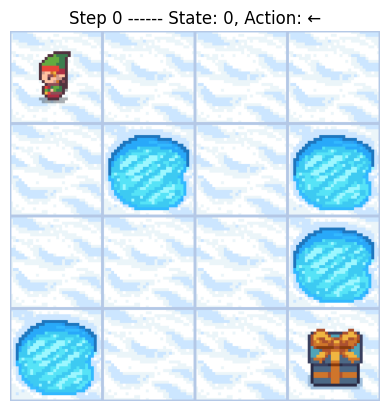

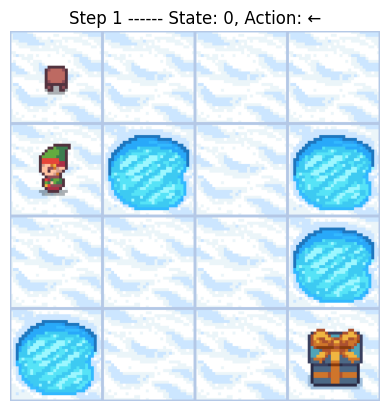

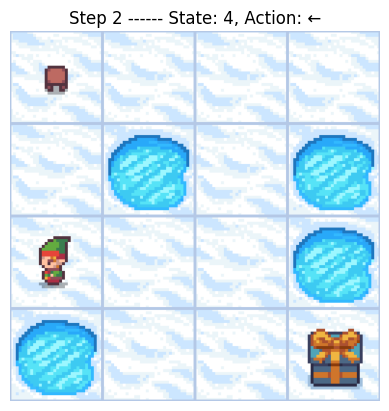

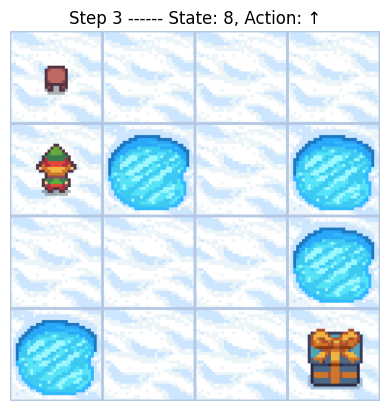

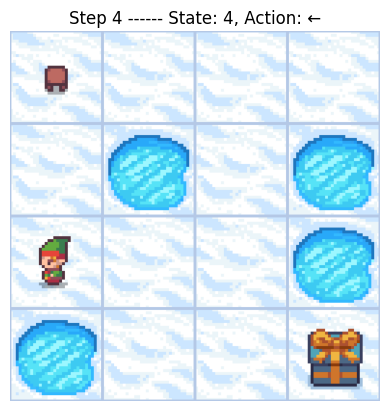

...

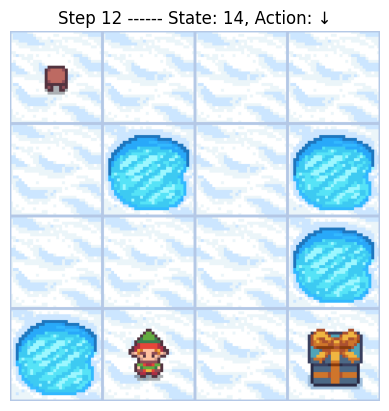

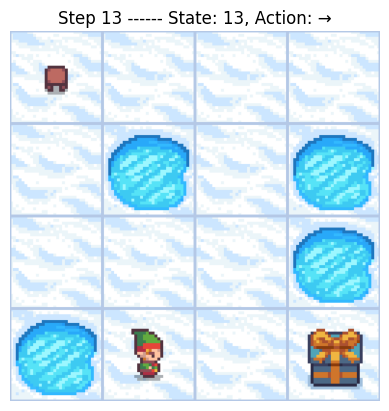

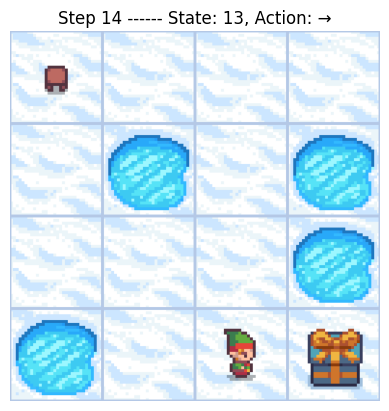

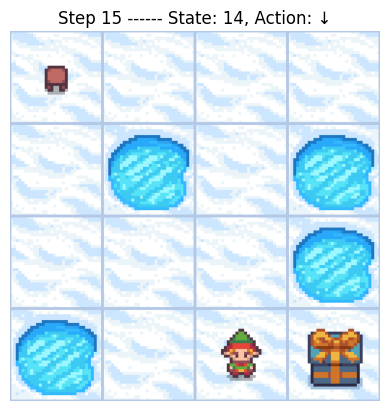

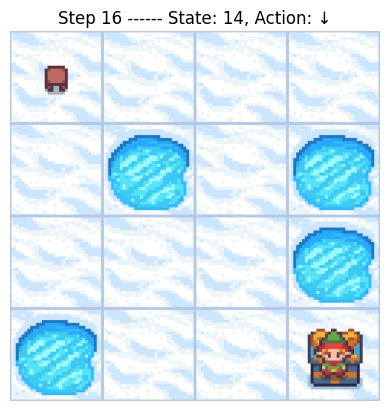


Final State: 15, Reward: 1.0
Number of steps used: 17


In [26]:
policy = {state: np.argmax(actions) for state, actions in Q.items()}
print("Time to train:", end - start)
print("Q-Values:")
print(Q)
print("Policy:")
print(convert_dict_to_matrix(convert_dict_to_arrow(policy)))


display_policy(policy)

### **Exercise 4 - Results Analysis**

- The Q-Learning algorithm trained the agent to learn the best actions for navigating the FrozenLake-v1 environment. It used an epsilon-greedy approach to balance trying new actions and sticking to the best-known actions.

- Over 50,000 episodes, the algorithm updated the Q-values for each state and action based on what the agent experienced. Epsilon started high (lots of exploration) and gradually decreased to focus more on exploitation (reusing known actions) as training went on. As training progressed, the Q-values stabilized, showing that the agent was learning the environment effectively.

- The Q-table stores the expected reward for each state and action. Higher Q-values are found for actions that lead closer to the goal, while states with hazards have lower values. The Q-table showed that the agent learned to prioritize safer, high-reward actions.

- The best policy was created by choosing the action with the highest Q-value for each state. This policy guides the agent efficiently to the goal while avoiding hazards. The policy shows clear and strategic paths to the goal.

- When the agent followed the learned policy, it reached the goal (state 15) in 17 steps, proving the policy was effective.

- Adjusting epsilon decay and the learning rate (alpha) changes how the agent learns. Faster decay reduces exploration early, while lower learning rates slow down learning. Tuning these parameters is important for finding the right balance between exploring and learning efficiently.

- The training took about 20 seconds for 50,000 episodes. While this worked well for a small environment like FrozenLake, Q-learning can struggle with larger environments because the Q-table grows too big.

The epsilon-greedy method in Q-Learning shows how the agent tries new moves while also sticking to the best actions it knows. Q-Learning learns the best actions no matter how the agent explores. This makes it both flexible and effective. It learns through rewards, updating Q-values based on the agent's actions and results, allowing the agent to understand the environment without any prior knowledge.

Value Iteration and Policy Iteration need a full model of the environment, while Q-Learning learns from experience without knowing the environment’s rules. Value and Policy Iteration work well in small, structured settings, but Q-Learning is more flexible and better for complex or unknown environments.

---

<h3 align="left"> <font color='darkred'><b> Exercice 5: Compare the Policies </b></font></h3>  

<p>
This exercice focuses on comparing the performance of the <b>Value Iteration</b>, <b>Policy Iteration</b>, and <b>Q-Learning</b> algorithms. Evaluate their convergence speed and performance.
</p>

<font color='darkred'><b>Your tasks are:</b>
<ol>
    <li>Compare the policies derived from Value Iteration, Policy Iteration, and Q-Learning. How do they differ?</li>
    <li>Evaluate the convergence speed of each algorithm. Which algorithm converges faster, and why?</li>
    <li>Analyze the computational complexity of each algorithm and discuss their strengths and limitations.</li>
</ol>
</font>

### **Exercise 5 - Analysis**

#### **Comparison of the policies:**

- **Value Iteration and Policy Iteration**: Both methods produce the same optimal policy, showing that they are equally effective at finding the best strategy for the environment. However, the way they reach this policy is different. Value Iteration focuses on updating the value of states repeatedly until it converges, while Policy Iteration alternates between evaluating and improving the policy, which can be more efficient in some cases.
- **Q-Learning**: The policy from Q-Learning is slightly different because of its exploration-exploitation compromise and the randomness in its training process. This approach allows Q-Learning to adapt and learn from the environment's random probability distribution but may lead to less optimal decisions if it is not fully converged. But if we take the most probable action at each state, the policy will be the same as the one found by Value Iteration and Policy Iteration.

#### **Convergence Speed**

- **Value Iteration**: Took 567 iterations to converge. Indeed, it requires iteratively updating the value of each state across the entire state space. This method can be slower in environments with many states or complex dynamics. The total execution time was 0.0578 seconds.
- **Policy Iteration**: Converged much faster in just 4 iterations by alternating between evaluating the policy and improving it. This process reduces redundant calculations and makes it more efficient for smaller environments. The process took 0.0340 seconds to complete.
- **Q-Learning**: Unlike the other two methods, Q-Learning doesn’t measure convergence by iterations but by training time. It required approximately 19.45 seconds to complete 50,000 episodes, reflecting the time needed for extensive exploration and interaction with the environment to stabilize the Q-values.

**Conclusion**: Policy Iteration is the fastest, thanks to its alternating policy evaluation and improvement steps. Value Iteration and Q-Learning take longer, with Q-Learning needing more training time due to exploration.

#### **Computational Complexity**

- **Value Iteration**: Requires many iterations, making it computationally heavy but reliable. It is straightforward and guarantees convergence to the optimal policy, making it reliable for small problems but very computationally heavy for more complex environnements.
- **Policy Iteration**: Fewer iterations but still computationally costly because of repeated policy evaluations. It is more efficient for environments with clear transitions and rewards.
- **Q-Learning**: Demands a lot of computation due to its exploration and randomness but works well even when the environment’s rules are unknown. Its flexibility allows it to handle unknown environments, but the randomness in exploration can make convergence slower and less predictable.

#### **Conclusion**

**Value Iteration:**
- **Strengths**: Simple and guarantees the best policy. It works well for smaller state spaces where computational costs are not to high.
- **Weaknesses**: Can be slow due to the high number of iterations needed.

**Policy Iteration:**
- **Strengths**: Faster convergence and efficient in well-defined environments. Alternating between evaluation and improvement steps ensures fewer iterations.
- **Weaknesses**: Requires computational effort for multiple policy evaluations which can make it slower for very large environments.

**Q-Learning:**
- **Strengths**: Works without knowing the environment’s rules and handles randomness well.  It is flexible and can handle environments where the rules are unknown or hard to define.
- **Weaknesses**: Training can take a long time, and convergence depends on balancing exploration and exploitation. The convergence may vary depending on parameters like the learning rate and epsilon decay.

---

<h3 align="left"> <font color='darkred'><b> Exercice 6: Consider Bigger Environment </b></font></h3>  

<p>
Extend your analysis by running the <b>Value Iteration</b> and <b>Policy Iteration</b> algorithms on a larger grid-based environment, <b>FrozenLake8x8-v1</b>.
</p>

<font color='darkred'><b>Your tasks are:</b>
<ol>
    <li>Run Value Iteration and Policy Iteration algorithms on <b>FrozenLake8x8-v1</b>. Compare their convergence speeds with the results from <b>FrozenLake-v1</b>.</li>
    <li>Analyze how the increased grid size affects the performance and computational requirements of each algorithm.</li>
</ol></font>

### Value Iteration on FrozenLake8x8-v1

In [49]:
import numpy as np
import time

# Your code
env = gym.make("FrozenLake8x8-v1", is_slippery=True, render_mode="rgb_array")
state, info = env.reset()

V = {state: 0 for state in range(env.observation_space.n)}
policy = {state: env.action_space.sample() for state in range(env.observation_space.n)}

sigma = 1e-10
gamma = 0.999
steps = 0

start = time.time()

while True:
    delta = 0
    Q = {state: [0 for _ in range(env.action_space.n)] for state in range(env.observation_space.n)}
    P_table = []
    for state, v in V.items():
        for action in range(env.action_space.n):
            Q[state][action] = sum(proba * (reward + gamma * V[next_state]) for proba, next_state, reward, _ in env.unwrapped.P[state][action])
        V[state] = max(Q[state])
        delta = max(delta, abs(v - V[state]))
    if delta < sigma:
        # extract the optimal policy
        policy = {state: max(range(env.action_space.n), key=lambda action: Q[state][action]) for state in range(env.observation_space.n)}
        break
    steps += 1

end = time.time()

def convert_dict_to_matrix8x8(dictionary):
    return np.array([dictionary[key] for key in sorted(dictionary.keys())]).reshape(8, 8)
def convert_dict_to_arrow(dict):
    return {key: actions_map[value] for key, value in dict.items()}

print("Number of steps:", steps, "Time taken:", end - start)
print("Value Function:")
print(convert_dict_to_matrix8x8(V))
print("Policy:")
print(convert_dict_to_matrix8x8(convert_dict_to_arrow(policy)))

value_iteration_policy = policy
print("Value Iteration Policy:")
print(value_iteration_policy)

Number of steps: 957 Time taken: 0.37061119079589844
Value Function:
[[0.89263549 0.89531608 0.8993016  0.90386555 0.90875647 0.91377112
  0.91859712 0.92238939]
 [0.89198803 0.8940192  0.89743825 0.90168895 0.90647082 0.91168917
  0.91756339 0.92515933]
 [0.87661264 0.86230129 0.81886154 0.         0.77771149 0.86527875
  0.90903403 0.93070752]
 [0.86386971 0.81154875 0.69930411 0.42058715 0.56372037 0.
  0.881561   0.93905064]
 [0.853721   0.71091231 0.46960207 0.         0.49455532 0.56836245
  0.79924568 0.95021372]
 [0.84613601 0.         0.         0.15271667 0.35306829 0.41299314
  0.         0.9642303 ]
 [0.84109197 0.         0.16422127 0.10554033 0.         0.31878891
  0.         0.98114246]
 [0.83857373 0.61217599 0.38761662 0.         0.27175741 0.54433091
  0.77150753 0.        ]]
Policy:
[['↑' '→' '→' '→' '→' '→' '→' '→']
 ['↑' '↑' '↑' '↑' '↑' '↑' '↑' '→']
 ['←' '↑' '←' '←' '→' '↑' '→' '→']
 ['←' '←' '←' '↓' '←' '←' '→' '→']
 ['←' '↑' '←' '←' '→' '↓' '↑' '→']
 ['←' '←' '

### Policy Iteration on FrozenLake8x8-v1

In [ ]:
# Your code
env = gym.make("FrozenLake8x8-v1", is_slippery=True, render_mode="rgb_array")
state, info = env.reset()

V = {state: 0 for state in range(env.observation_space.n)}
pi = {state: env.action_space.sample() for state in range(env.observation_space.n)}
policy = {state: env.action_space.sample() for state in range(env.observation_space.n)}

sigma = 1e-10
gamma = 0.999
steps = 0


# Policy Evaluation
def evaluate_policy(env, pi, V, gamma, sigma):
    while True:
        delta = 0
        for state in range(env.observation_space.n):
            v = V[state]
            V[state] = sum(proba * (reward + gamma * V[next_state]) for proba, next_state, reward, _ in env.unwrapped.P[state][pi[state]])
            delta = max(delta, abs(v - V[state]))
        if delta < sigma:
            break
# Policy Improvement
def improve_policy(env, pi, V, gamma):
    policy_stable = True
    for state in range(env.observation_space.n):
        b = pi[state]
        pi[state] = max(range(env.action_space.n), key=lambda action: sum(proba * (reward + gamma * V[next_state]) for proba, next_state, reward, _ in env.unwrapped.P[state][action]))
        if b != pi[state]:
            policy_stable = False
    if policy_stable:
        return True
    return False

start = time.time()

for _ in range(1000):
    evaluate_policy(env, pi, V, gamma, sigma)
    if improve_policy(env, pi, V, gamma):
        break
    steps += 1

end = time.time()

print("Number of steps:", steps, "Time taken:", end - start)
print("Value Function:")
print(convert_dict_to_matrix8x8(V))
print("Policy:")
print(convert_dict_to_matrix8x8(convert_dict_to_arrow(pi)))

policy_iteration_rewards = pi

Number of steps: 10 Time taken: 0.24059271812438965
Value Function:
[[0.89263549 0.89531608 0.8993016  0.90386555 0.90875647 0.91377112
  0.91859712 0.92238939]
 [0.89198803 0.8940192  0.89743825 0.90168895 0.90647082 0.91168917
  0.91756339 0.92515933]
 [0.87661264 0.8623013  0.81886154 0.         0.77771149 0.86527875
  0.90903403 0.93070752]
 [0.86386972 0.81154875 0.69930411 0.42058715 0.56372037 0.
  0.881561   0.93905064]
 [0.853721   0.71091232 0.46960207 0.         0.49455532 0.56836245
  0.79924568 0.95021372]
 [0.84613601 0.         0.         0.15271667 0.35306829 0.41299314
  0.         0.9642303 ]
 [0.84109197 0.         0.16422127 0.10554033 0.         0.31878891
  0.         0.98114246]
 [0.83857373 0.61217599 0.38761662 0.         0.27175741 0.54433091
  0.77150753 0.        ]]
Policy:
[['↑' '→' '→' '→' '→' '→' '→' '→']
 ['↑' '↑' '↑' '↑' '↑' '↑' '↑' '→']
 ['←' '↑' '←' '←' '→' '↑' '→' '→']
 ['←' '←' '←' '↓' '←' '←' '→' '→']
 ['←' '↑' '←' '←' '→' '↓' '↑' '→']
 ['←' '←' '←

In [ ]:
def try_n_games(n, policy):
    env = gym.make("FrozenLake8x8-v1", is_slippery=True, render_mode="rgb_array")
    rewards = []
    all_steps = []
    for _ in range(n):
        state = env.reset()[0]
        done = False
        total_reward = 0
        steps = 0
        while not done:
            action = policy[state]
            new_state, reward, done, _, _ = env.step(action)
            total_reward += reward
            state = new_state
            steps += 1
        rewards.append(total_reward)
        all_steps.append(steps)
    env.close()
    return rewards, all_steps

n = 5000

value_iteration_rewards, value_it_steps = try_n_games(n, value_iteration_policy)
policy_iteration_rewards, policy_it_steps = try_n_games(n, policy_iteration_rewards)

print("number of Value Iteration Policy Rewards:", sum(value_iteration_rewards), "| average steps:", sum(value_it_steps)/n)
print("number of Policy Iteration Policy Rewards:", sum(policy_iteration_rewards), "| average steps:", sum(policy_it_steps)/n)

number of Value Iteration Policy Rewards: 5000.0 | average steps: 115.565
number of Policy Iteration Policy Rewards: 5000.0 | average steps: 118.0708


| Algorithm                | Policy Rewards | Average Steps to solve | Number of Steps to train | Time Taken to train       |
|--------------------------|-----------------|---------------|-----------------|------------------|
| Value Iteration          | 100%          | 115.565       | 957             | 0.37061119079589844 |
| Policy Iteration         | 100%          | 118.0708      | 10              | 0.24059271812438965 |


## Interpretation of Results

### Value Iteration
- The Value Iteration algorithm achieved 100% policy rewards, indicating that it successfully found the optimal policy.
- It took an average of 115.565 steps to solve the environment, which is relatively efficient.
- The algorithm required 957 steps to train, which is significantly higher compared to Policy Iteration.
- The training time of approximately 0.37 seconds is moderate but higher than Policy Iteration.

### Policy Iteration
- The Policy Iteration algorithm also achieved 100% policy rewards, confirming its effectiveness in finding the optimal policy.
- It took an average of 118.0708 steps to solve the environment, slightly higher than Value Iteration but still efficient.
- The algorithm required only 10 steps to train, which is remarkably low compared to Value Iteration.
- The training time of approximately 0.24 seconds is shorter than Value Iteration, indicating higher efficiency.

### Comparison
- **Policy Rewards:** Both algorithms achieved 100% policy rewards, indicating that they both successfully found the optimal policy.
- **Average Steps to Solve:** Policy Iteration took slightly more steps (118.0708) compared to Value Iteration (115.565), but the difference is minimal.
- **Number of Steps to Train:** Policy Iteration required significantly fewer steps (10) to train compared to Value Iteration (957), highlighting its efficiency.
- **Time Taken to Train:** Policy Iteration took less time (0.24 seconds) to train compared to Value Iteration (0.37 seconds), further emphasizing its efficiency.

### Conclusion
Policy Iteration is more efficient than Value Iteration in terms of the number of steps and time taken to train, while both algorithms achieve the same policy rewards. Policy Iteration's ability to converge faster with fewer training steps makes it a preferable choice for environments where training efficiency is crucial.


--- 

## Show 8x8 Frozen Lake solution with Policy Iteration

With the Value Iteration Policy:

Simulating the agent's steps:


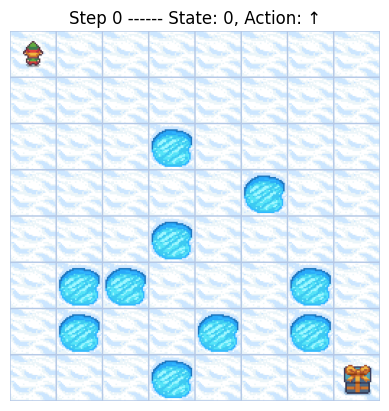

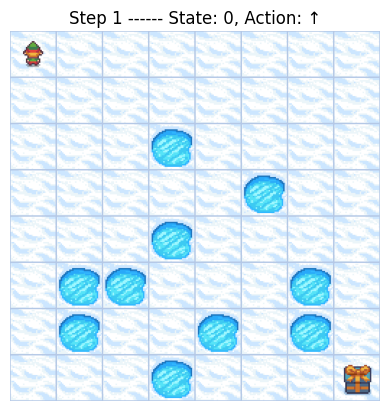

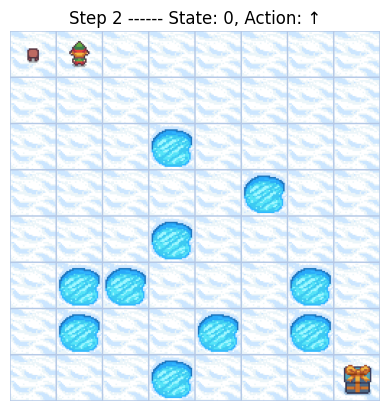

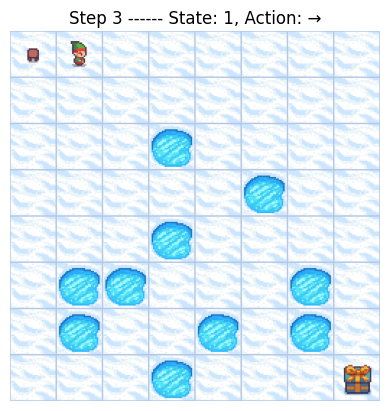

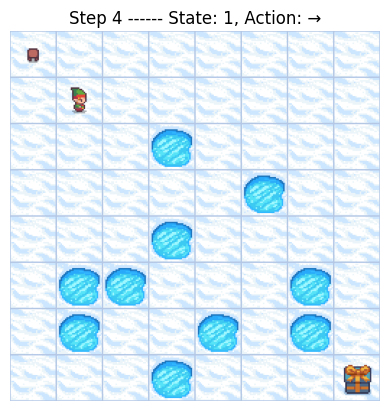

...

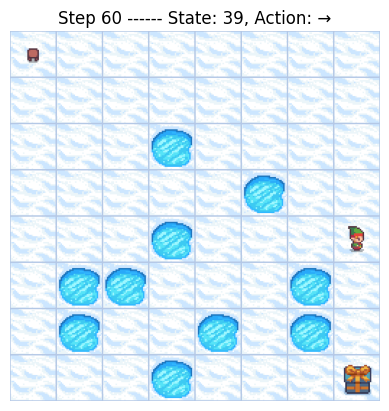

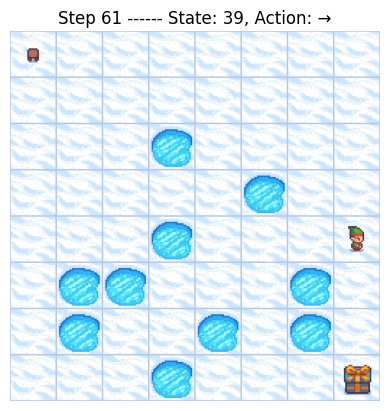

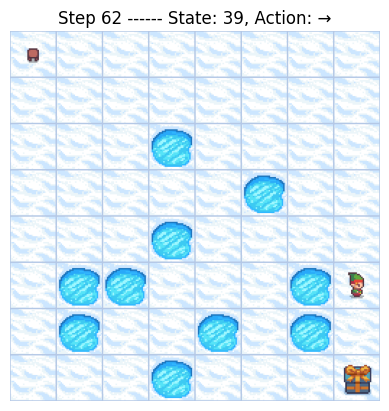

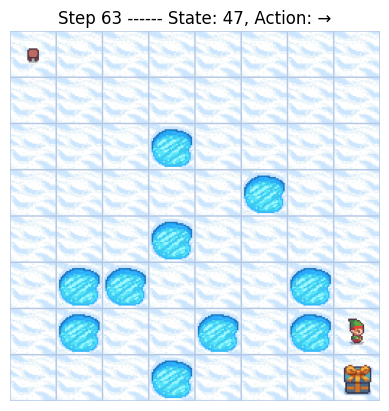

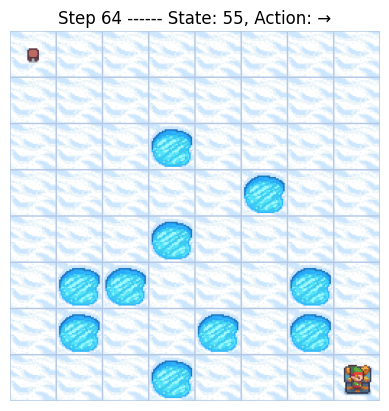


Final State: 63, Reward: 1.0
Number of steps used: 65


In [ ]:
import matplotlib.pyplot as plt

def display_policy8x8(policy):
    env = gym.make("FrozenLake8x8-v1", is_slippery=True, render_mode="rgb_array")
    # Visualization: Simulate the environment using the derived policy
    state = env.reset()[0]
    finished = False

    print("\nSimulating the agent's steps:")
    steps = 0
    while not finished:
        # Take the action based on the optimal policy
        action = policy[state]
        new_state, reward, finished, _, _ = env.step(action)

        # Render the environment and display steps
        img = env.render()
        plt.imshow(img)

        plt.title(f"Step {steps} ------ State: {state}, Action: {actions_map[action]}")
        plt.axis('off')
        plt.show()

        # Transition to the new state
        state = new_state
        steps = steps + 1

    # Final reward and state
    print(f"\nFinal State: {state}, Reward: {reward}")
    print(f"Number of steps used: {steps}")
    env.close()

print("With the Value Iteration Policy:")
display_policy8x8(value_iteration_policy)